In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
def _normalize_image(img, Io=240, alpha=1, beta=0.15):
    ''' Normalize staining appearence of H&E stained images

    Input:
        I: RGB input image
        Io: (optional) transmitted light intensity

    Output:
        Inorm: normalized image
        H: hematoxylin image
        E: eosin image

    Reference:
        A method for normalizing histology slides for quantitative analysis. M.
        Macenko et al., ISBI 2009
    '''

    HERef = np.array([[0.5626, 0.2159],
                    [0.7201, 0.8012],
                    [0.4062, 0.5581]])

    maxCRef = np.array([1.9705, 1.0308])

    # define height and width of image
    h, w, _ = img.shape

    # reshape image
    img = img.reshape((-1, 3))

    # calculate optical density
    OD = -np.log((img.astype(float)+1)/Io)

    # remove transparent pixels
    ODhat = OD[~np.any(OD < beta, axis=1)]

    # compute eigenvectors
    _, eigvecs = np.linalg.eigh(np.cov(ODhat.T))

    #project on the plane spanned by the eigenvectors corresponding to the two
    # largest eigenvalues
    That = ODhat.dot(eigvecs[:, 1:3])

    phi = np.arctan2(That[:, 1],That[:, 0])

    minPhi = np.percentile(phi, alpha)
    maxPhi = np.percentile(phi, 100-alpha)

    vMin = eigvecs[:, 1:3].dot(np.array([(np.cos(minPhi), np.sin(minPhi))]).T)
    vMax = eigvecs[:, 1:3].dot(np.array([(np.cos(maxPhi), np.sin(maxPhi))]).T)

    # a heuristic to make the vector corresponding to hematoxylin first and the
    # one corresponding to eosin second
    if vMin[0] > vMax[0]:
        HE = np.array((vMin[:, 0], vMax[:, 0])).T
    else:
        HE = np.array((vMax[:, 0], vMin[:, 0])).T

    # rows correspond to channels (RGB), columns to OD values
    Y = np.reshape(OD, (-1, 3)).T

    # determine concentrations of the individual stains
    C = np.linalg.lstsq(HE,Y, rcond=None)[0]

    # normalize stain concentrations
    maxC = np.array([np.percentile(C[0, :], 99), np.percentile(C[1, :],99)])
    tmp = np.divide(maxC,maxCRef)
    C2 = np.divide(C,tmp[:, np.newaxis])

    # recreate the image using reference mixing matrix
    Inorm = np.multiply(Io, np.exp(-HERef.dot(C2)))
    Inorm[Inorm > 255] = 254
    Inorm = np.reshape(Inorm.T, (h, w, 3)).astype(np.uint8)

    # Inorm = cv2.normalize(Inorm, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

    return Inorm

In [3]:
test_image_cv = cv2.cvtColor(cv2.imread(r"C:\Users\093637\Documents\EMC-Seminoma-Relapse\Test\test_tile_tcga.ome.tif"), cv2.COLOR_BGR2RGB)

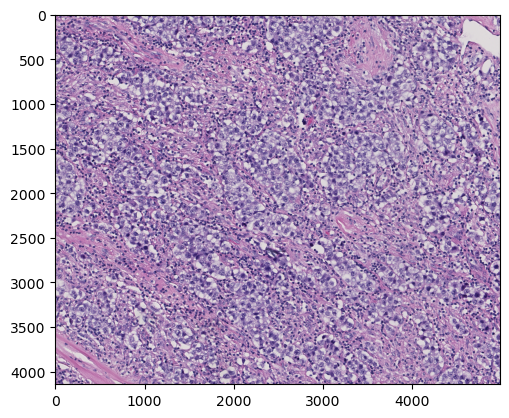

In [4]:
plt.imshow(test_image_cv)

In [8]:
%timeit output = cv2.resize(test_image_cv, (224, 224), interpolation=cv2.INTER_NEAREST)

236 µs ± 74.2 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [9]:
%timeit output = cv2.resize(test_image_cv, (224, 224), interpolation=cv2.INTER_LINEAR)

427 µs ± 110 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [11]:
from PIL import Image

In [13]:
img = Image.open(r"C:\Users\093637\Documents\EMC-Seminoma-Relapse\Test\test_tile_tcga.ome.tif")

In [15]:
%timeit img.resize((224, 224))

113 ms ± 10.3 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


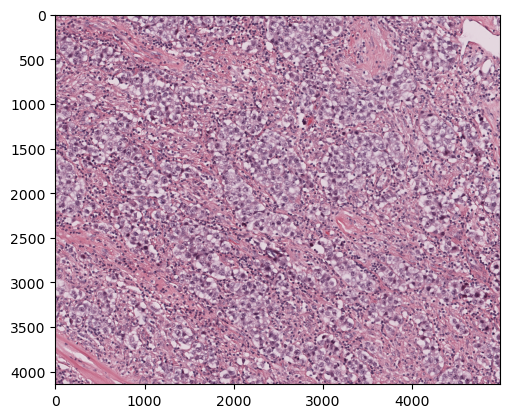

In [5]:
test_image_normalized = _normalize_image(test_image)
plt.imshow(test_image_normalized)

In [6]:
test_image2 = cv2.cvtColor(cv2.imread("TZ_89_G_HE_1 (1, x=64931, y=85334, w=5309, h=4115).tif"), cv2.COLOR_BGR2RGB)

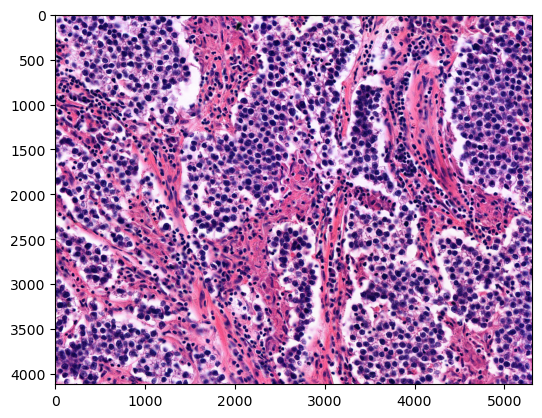

In [7]:
plt.imshow(test_image2)

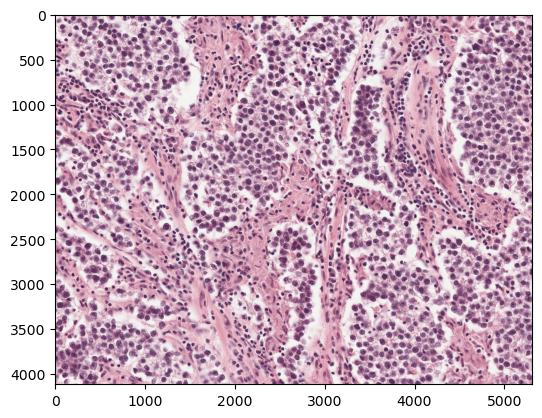

In [8]:
test_image2_normalized = _normalize_image(test_image2)
plt.imshow(test_image2_normalized)

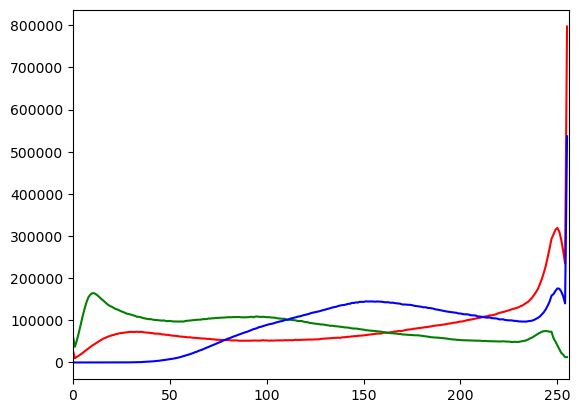

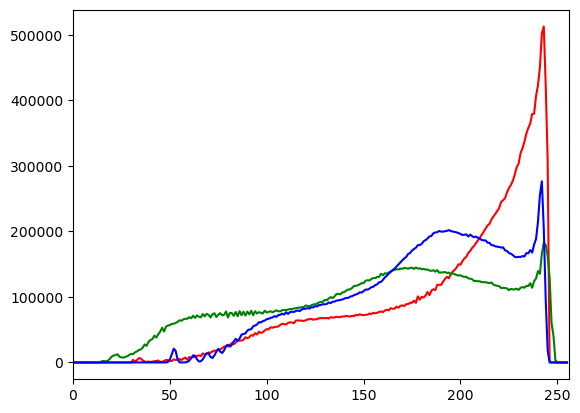

In [9]:
for i, col in enumerate(['r', 'g', 'b']):
    hist = cv2.calcHist([test_image2], [i], None, [256], [0, 256])
    plt.plot(hist, color = col)
    plt.xlim([0, 256])
    
plt.show()
for i, col in enumerate(['r', 'g', 'b']):
    hist = cv2.calcHist([test_image2_normalized], [i], None, [256], [0, 256])
    plt.plot(hist, color = col)
    plt.xlim([0, 256])
    
plt.show()

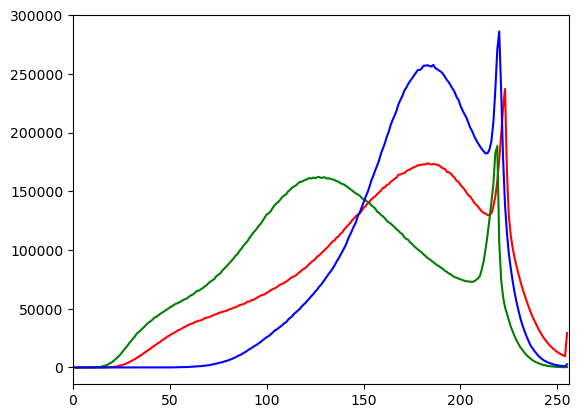

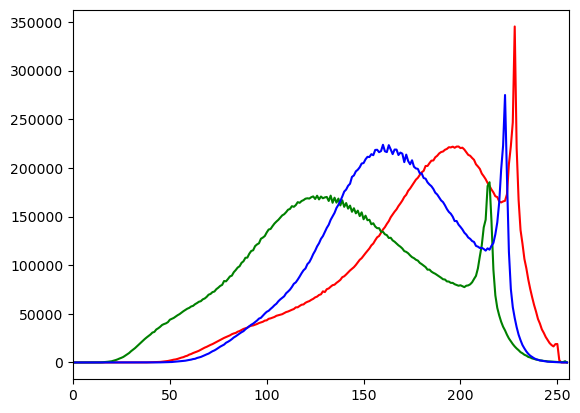

In [10]:
for i, col in enumerate(['r', 'g', 'b']):
    hist = cv2.calcHist([test_image], [i], None, [256], [0, 256])
    plt.plot(hist, color = col)
    plt.xlim([0, 256])
    
plt.show()

for i, col in enumerate(['r', 'g', 'b']):
    hist = cv2.calcHist([test_image_normalized], [i], None, [256], [0, 256])
    plt.plot(hist, color = col)
    plt.xlim([0, 256])
    
plt.show()

In [16]:
OPENSLIDE_PATH = r'C:\Users\093637\Documents\EMC-Seminoma-Relapse\openslide-win64\bin'

import os
if hasattr(os, 'add_dll_directory'):
    # Windows
    with os.add_dll_directory(OPENSLIDE_PATH):
        import openslide
else:
    import openslide

from itertools import product
from shapely.geometry import shape, box
import json
import numpy as np

def tile_slide(annotation_path, tile_size, downsample):
    """
    Generate coordinates for tiles that overlap with annotations in a whole slide image.

    Parameters:
    - annotation_path (str): The path to the annotation file in GeoJSON format.
    - tile_size (tuple): A tuple of the size of the tiles to be generated in pixels.
    - downsample (int): The amount to downsample the image by.

    Returns:
    - tuple: A tuple containing a list of tile coordinates that overlap with annotations, and the number of tiles.

    """
    # load annotation(s)
    with open(annotation_path, 'r', encoding="utf8") as file:
        annotation = json.load(file)

    # Check if the annotation has holes (and if so, only take the exterior of the annotation)
    try:
        annotation_polys = [poly for poly in list(shape(f["geometry"]).geoms) for f in annotation["features"]]
    except:
        annotation_polys = [shape(f["geometry"]) for f in annotation["features"]]

    # initialize bounding box around first annotation
    bbox = annotation_polys[0].bounds

    if len(annotation_polys) > 1:
        # iterate over annotations, if annotation found to be outside bounding box,
        # adjust edge to that annotation
        for poly in annotation_polys:
            bbox = (min(bbox[0], poly.bounds[0]), min(bbox[1], poly.bounds[1]),
                    max(bbox[2], poly.bounds[2]), max(bbox[3], poly.bounds[3]))

    # bbox is stored as (xmin, ymin, xmax, ymax)
    width = bbox[2] - bbox[0]
    height = bbox[3] - bbox[1]

    # calculate the width and difference with the old so that the box becomes a multiple
    # of the tile size
    new_width, width_diff = np.ceil(width / tile_size[0]) * tile_size[0], \
                            np.ceil(width / tile_size[0]) * tile_size[0] - width
    new_height, height_diff = np.ceil(height / tile_size[1]) * tile_size[1], \
                              np.ceil(height / tile_size[1]) * tile_size[1] - height

    # shift box so that it is centered around all annotations
    bbox_scaled = (
        bbox[0] - width_diff // 2,
        bbox[1] - height_diff // 2,
        bbox[0] + new_width - width_diff // 2,
        bbox[1] + new_height - height_diff // 2
    )

    # get x and y gridpoints the tiles should be generated on
    x_range = np.arange(bbox_scaled[0], bbox_scaled[2], tile_size[0] * downsample)
    y_range = np.arange(bbox_scaled[1], bbox_scaled[3], tile_size[1] * downsample)

    # check the overlapping between the tile and the annotation polygons, discard tiles that
    # do not intersect with the annotations
    
    tile_coordinates = []
    
    for x, y in product(x_range, y_range):
        tile_box = box(x, y, x + tile_size[0] * downsample, y + tile_size[1] * downsample)
        for poly in annotation_polys:
            if poly.intersects(tile_box):
                if poly.intersection(tile_box).area / tile_box.area > 0.5:
                    tile_coordinates.append((int(x), int(y)))
            
    count = len(tile_coordinates)

    return tile_coordinates, count

In [12]:
coords, n_tiles = tile_slide('Y:\Testicular cancer project\Database\Cohort_TCGA\Annotations\TCGA-2G-AAHN-01Z-00-DX1.B5CCB104-C436-4B80-8F47-EB9C7D13ACF0.geojson', (512, 512), 2)

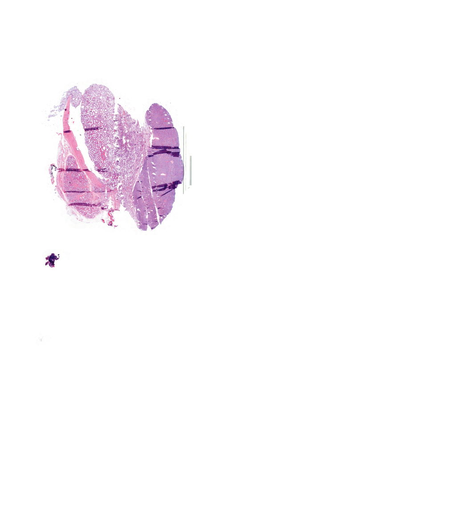

In [42]:
slide = openslide.OpenSlide(r'Y:\Testicular cancer project\Database\Cohort_EMC\Images\TZ_11_I-C_HE_1.mrxs')
slide.get_thumbnail((512, 512))

In [99]:
slide.level_dimensions[0]

(77688, 69679)

In [43]:
slide.get_best_level_for_downsample(16)

4

In [59]:
slide.level_downsamples

(1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0)

In [61]:
slide.properties['openslide.bounds-y']

'89344'

In [90]:
tile_test = slide.read_region((72500, 125000), 4, (2048, 2048))

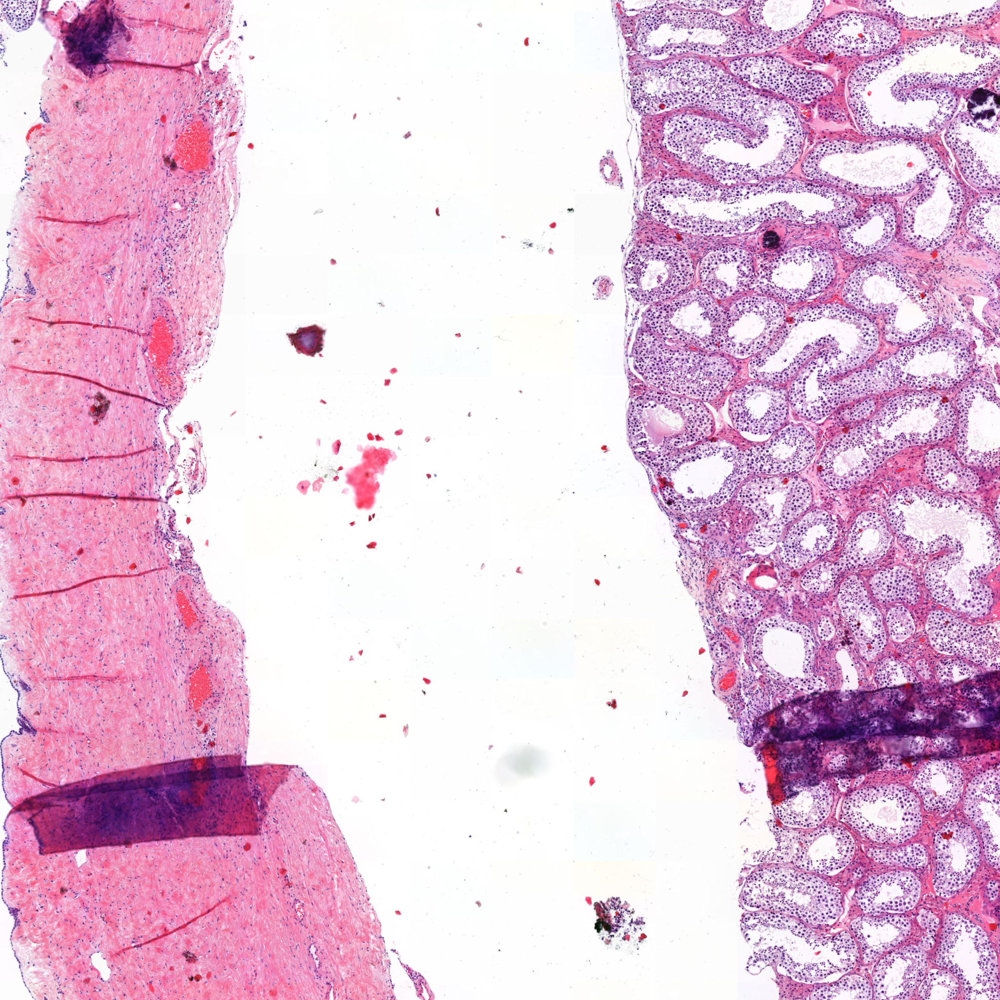

In [91]:
tile_test

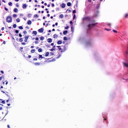

In [89]:
tile_test.resize((128, 128))

In [83]:
np.log2(16)

4.0

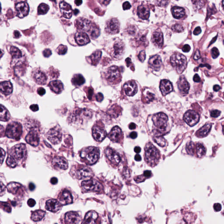

In [20]:
tile_test.resize((224, 224))

In [22]:
gray_tile = cv2.cvtColor(np.array(tile_test), cv2.COLOR_BGRA2GRAY)

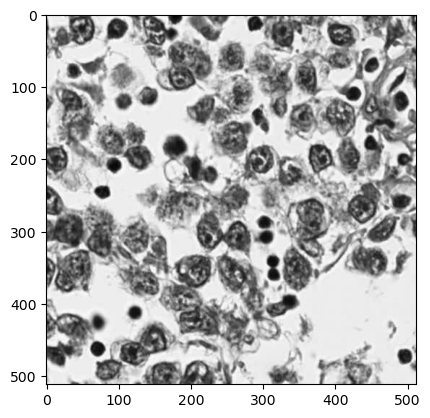

In [24]:
plt.imshow(gray_tile, cmap='gray')

In [37]:
from PIL import ImageOps

In [38]:
tissue_pixels = np.count_nonzero(ImageOps.grayscale(tile_test) < 240)
(tissue_pixels / (gray_tile.shape[0] * gray_tile.shape[1])) * 100

TypeError: '<' not supported between instances of 'Image' and 'int'

In [30]:
_, threshold_tile = cv2.threshold(gray_tile, 240, 255, cv2.THRESH_BINARY_INV)

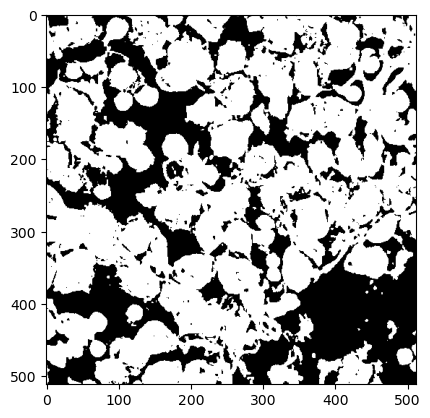

In [35]:
plt.imshow(gray_tile < 220, cmap='gray')

In [141]:
tile_test = np.array(tile_test)

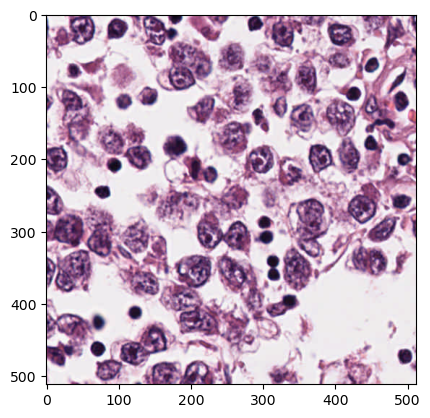

In [142]:
import matplotlib.pyplot as plt
plt.imshow(tile_test)

In [ ]:
tile.shape

(512, 512, 4)

In [ ]:
tile_normalized = _normalize_image(tile[:, :, :3])

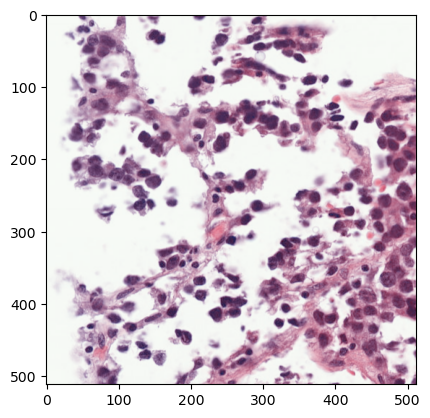

In [ ]:
plt.imshow(tile_normalized)

In [ ]:
base_dir = r"\\store\isilon\archive\EUCGR_storage\Zaadbalkanker\Testicular cancer project\Database\Cohort_EMC\\"

image_annotation_paths = []
for dirpath, _, filenames in os.walk(os.path.abspath(os.path.join(base_dir, 'Images'))):
    for filename in filenames:
        if filename.endswith('.mrxs'):
            image_path = os.path.join(dirpath, filename)
            annotation_path = os.path.abspath(os.path.join(base_dir, 'Annotations', os.path.relpath(dirpath, os.path.abspath(os.path.join(base_dir, 'Converted and anonymized'))), filename.replace('.mrxs', '.geojson')))
            if os.path.exists(annotation_path):
                image_annotation_paths.append((image_path, annotation_path))

In [ ]:
def generate_image_annotation_paths(base_dir):
    image_annotation_paths = []

    images_dir = os.path.abspath(os.path.join(base_dir, 'Images'))
    annotations_dir = os.path.abspath(os.path.join(base_dir, 'Annotations'))

    for dirpath, _, filenames in os.walk(images_dir):
        for filename in filenames:
            if filename.endswith('.mrxs'):
                print(filename)
                image_path = os.path.join(dirpath, filename)
                annotation_filename = filename.replace('.mrxs', '.geojson')
                annotation_path = os.path.join(annotations_dir, os.path.relpath(dirpath, images_dir), annotation_filename)

                if os.path.exists(annotation_path):
                    image_annotation_paths.append((image_path, annotation_path))

    return image_annotation_paths

In [ ]:
generate_image_annotation_paths(base_dir)

TZ_92_I-C_HE_2.mrxs
TZ_98_6_HE_2.mrxs
TZ_95_3_HE_1.mrxs
TZ_17_H_HE_2.mrxs
TZ_19_E_oct3_4.mrxs
TZ_92_I-C_oct3_4.mrxs
TZ_19_E_HE_2.mrxs
TZ_72_II-C_HE_2.mrxs
TZ_87_II-H_oct3_4.mrxs
TZ_29_H_HE_2.mrxs
TZ_59_ML_C_HE_1.mrxs
TZ_88_E_HE_1.mrxs
TZ_91_ML_II-C_oct3_4.mrxs
TZ_56_E_oct3_4.mrxs
TZ_46_ML_HE_2.mrxs
TZ_38_B_oct3_4.mrxs
TZ_65_D_oct3_4.mrxs
TZ_71_D_HE_1.mrxs
TZ_66_II-F_oct3_4.mrxs
TZ_84_I-D_oct3_4.mrxs
TZ_93_M_I_oct3_4.mrxs
TZ_68_I-B_HE_1.mrxs
TZ_23_F_HE_1.mrxs
TZ_82_D_oct3_4.mrxs
TZ_16_C_oct3_4.mrxs
TZ_49_I-D_HE_2.mrxs
TZ_31_D_oct3_4.mrxs
TZ_08_G_HE_1.mrxs
TZ_27_C_HE_2.mrxs
TZ_85_ML_II-B4_HE_1.mrxs
TZ_56_E_HE_1.mrxs
TZ_60_I-C_HE_1.mrxs
TZ_45_F_oct3_4.mrxs
TZ_36_C_oct3_4.mrxs
TZ_79_F_HE_2.mrxs
TZ_02_I-F_oct3_4.mrxs
TZ_09_I-F_oct3_4.mrxs
TZ_52_I-E_HE_2.mrxs
TZ_15_C_HE_1.mrxs
TZ_09_I-F_HE_1.mrxs
TZ_15_C_HE_2.mrxs
TZ_55_F_HE_1.mrxs
TZ_68_I-B_HE_2.mrxs
TZ_75_F_oct3_4.mrxs
TZ_67_II-G_oct3_4.mrxs
TZ_40_C_HE_1.mrxs
TZ_90_G_HE_1.mrxs
TZ_22_MB_II_HE_1.mrxs
TZ_05_B_oct3_4.mrxs
TZ_22_MB_II_HE_2.mrxs

[('\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Images\\TZ_92_I-C_HE_2.mrxs',
  '\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Annotations\\.\\TZ_92_I-C_HE_2.geojson'),
 ('\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Images\\TZ_95_3_HE_1.mrxs',
  '\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Annotations\\.\\TZ_95_3_HE_1.geojson'),
 ('\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Images\\TZ_17_H_HE_2.mrxs',
  '\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Annotations\\.\\TZ_17_H_HE_2.geojson'),
 ('\\\\store\\isilon\\archive\\EUCGR_storage\\Zaadbalkanker\\Testicular cancer project\\Database\\Cohort_EMC\\Images\\TZ_19_E_HE_2.m

In [ ]:
import pandas as pd
import glob

slide_list = pd.read_excel('W://Cohort_EMC/Cohort_EMC.xlsx', header=0).set_index('ID')
tile_path = 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized'
tile_list = []

for patient in slide_list.index:
    for file in glob.glob(f'{tile_path}\**\{patient}*.png'):
            tile_list.append(file)

In [ ]:
tile_list

['C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_1\\TZ_01_IIID_HE_1_127910_24348.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_1\\TZ_01_IIID_HE_1_140198_22300.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_1\\TZ_01_IIID_HE_1_76710_34588.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_1\\TZ_01_IIID_HE_1_86950_12060.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_1\\TZ_01_IIID_HE_1_91046_114460.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_2\\TZ_01_IIID_HE_2_53973_91823.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_2\\TZ_01_IIID_HE_2_62165_85679.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_normalized\\TZ_01_IIID_HE_2\\TZ_01_IIID_HE_2_74453_38575.png',
 'C:/Users/093637/Documents/EMC-Seminoma-Relapse/tile

In [18]:
for patient in slide_list.index:
    print(patient)

NameError: name 'slide_list' is not defined

In [ ]:
import glob

for name in glob.glob(r'C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\**\TZ_01_IIID*.png'):
    print(name)

C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_1\TZ_01_IIID_HE_1_127910_24348.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_1\TZ_01_IIID_HE_1_140198_22300.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_1\TZ_01_IIID_HE_1_76710_34588.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_1\TZ_01_IIID_HE_1_86950_12060.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_1\TZ_01_IIID_HE_1_91046_114460.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_2\TZ_01_IIID_HE_2_53973_91823.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_2\TZ_01_IIID_HE_2_62165_85679.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_2\TZ_01_IIID_HE_2_74453_38575.png
C:\Users\093637\Documents\EMC-Seminoma-Relapse\tiles_normalized\TZ_01_IIID_HE_2\TZ_01_IIID_HE_2_78549

In [143]:
import tensorflow as tf
model = tf.keras.models.load_model('seminoma_subtypes_model_new.h5')

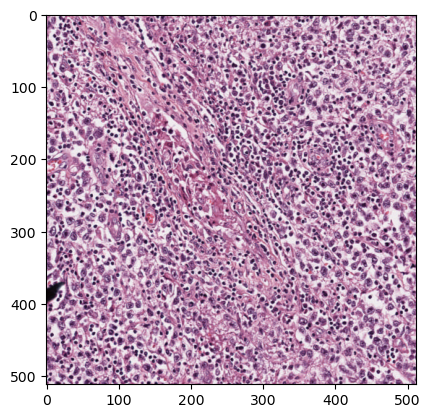

In [80]:
example_tile = cv2.imread('C:/Users/093637/Documents/EMC-Seminoma-Relapse/tiles_tcga/TCGA-ZM-AA0B-01Z-00-DX1.8EC8DBCC-20B6-4341-AA19-B7A01E795345.svs/TCGA-ZM-AA0B-01Z-00-DX1.8EC8DBCC-20B6-4341-AA19-B7A01E795345.svs_51414_26133.png')
example_tile = cv2.cvtColor(example_tile, cv2.COLOR_BGR2RGB)
plt.imshow(example_tile)

In [52]:
from tensorflow.keras.applications.mobilenet import preprocess_input

In [144]:
tile_test = cv2.resize(tile_test, (299, 299))

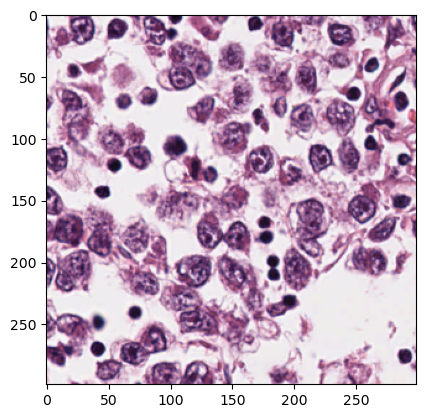

In [145]:
plt.imshow(tile_test)

In [148]:
tile_test_preproc = tile_test / 255

In [149]:
model.predict(np.expand_dims(tile_test_preproc[:, :, :3], 0))

1/1 [==============================] - 0s 75ms/step


array([[0.99999046]], dtype=float32)

In [150]:
last_conv_layer_name = "conv_pw_13_relu"

In [151]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [129]:
import tensorflow.keras as keras

1/1 [==============================] - 0s 78ms/step


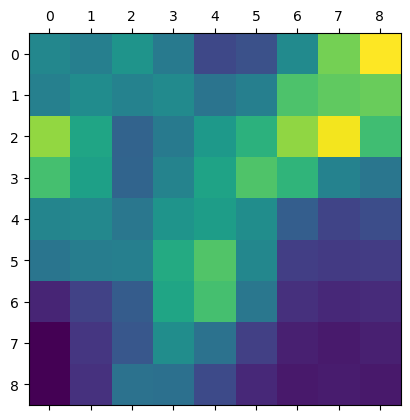

In [152]:
model.layers[-1].activation = None

img_array = tile_test_preproc[:, :, :3].reshape(1, 299, 299, 3)

# Print what the top predicted class is
preds = model.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

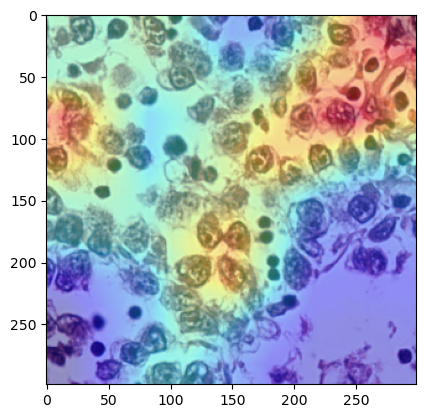

In [153]:
plt.imshow(tile_test_preproc)
plt.imshow(cv2.resize(heatmap, (299, 299), None), alpha=0.4, cmap='jet')

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
from datagenerator_survival import Datagen

In [4]:
import config
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [29]:
patient_data = pd.read_excel(config.cohort_settings['cohort_file'], header=0, engine="openpyxl").set_index('ID')

# if not config.cohort_settings['synchronous']:
#     patient_data = patient_data.drop(patient_data[patient_data['Synchronous'] == 1].index)
# if not config.cohort_settings['treatment']:
#     patient_data = patient_data.drop(patient_data[patient_data['Treatment'] == 1].index)

print(patient_data.head(10))

train_index, test_index, _, _ = train_test_split(
    patient_data.index, patient_data['Event'], test_size=0.2, random_state=0)


print(f"  Train: index={train_index}")
print(f"  Test:  index={test_index}")

print(patient_data.loc[train_index])

# INPUT_PATH = 'Y:/EMC_512_5/'
INPUT_PATH = './tiles-normalized/Training/Oversampled/'

clinical_vars = ['RTI', 'LVI', 'Size']

train_gen = Datagen(patient_data,
                    256, 
                    INPUT_PATH, 
                    batch_size=32, 
                    train=True, 
                    imagenet=True)

            Event   Time  Synchronous  Treatment  Size  RTI  LVI
ID                                                              
TZ_01_IIID      0    NaN          NaN        NaN   NaN  NaN  NaN
TZ_02_I-F       1   0.03          1.0        1.0   6.0  0.0  1.0
TZ_03_G         1   0.00          1.0        1.0  18.5  1.0  0.0
TZ_06_F         0  46.52          0.0        0.0   1.9  0.0  0.0
TZ_07_D         0  82.04          0.0        1.0   3.0  1.0  0.0
TZ_08_G         0  64.79          1.0        1.0   5.8  1.0  0.0
TZ_09_I-F       1   0.00          1.0        1.0  11.5  1.0  1.0
TZ_10_D         0  92.65          0.0        0.0   1.0  0.0  0.0
TZ_11_I-C       0  84.83          0.0        1.0   5.5  0.0  0.0
TZ_13_B         0  85.59          1.0        1.0   4.1  1.0  0.0
  Train: index=Index(['TZ_07_D', 'TZ_62_E', 'TZ_86_I', 'TZ_03_G', 'TZ_15_C', 'TZ_90_G',
       'TZ_14_D', 'TZ_48_I-C', 'TZ_97_2', 'TZ_72_II-C', 'TZ_50_I-F', 'TZ_10_D',
       'TZ_18_D', 'TZ_40_C', 'TZ_44_D', 'TZ_42_I-E',

In [30]:
train_gen.tile_list

['./tiles-normalized/Training/Oversampled/0\\TZ_01_IIID_HE_1_86950_12060.png_hflip_27.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_01_IIID_HE_2_62165_85679.png_vflip_4.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_06_F_HE_1_107638_215221.png_hflip_21.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_06_F_HE_1_107638_215221.png_vflip_32.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_06_F_HE_1_31862_221365.png_hflip_33.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_06_F_HE_2_66533_56482.png_hflip_15.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_10_D_HE_2_102693_98706.png_vflip_0.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_13_B_HE_2_117141_106916.png_vflip_31.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_15_C_HE_1_60618_87329.png_hflip_26.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_15_C_HE_2_118271_216125.png_vflip_7.jpg',
 './tiles-normalized/Training/Oversampled/0\\TZ_16_C_HE_2_79707_248282.png_hflip_2.jpg',
 './tile

In [31]:
X, y = train_gen.__getitem__(0)

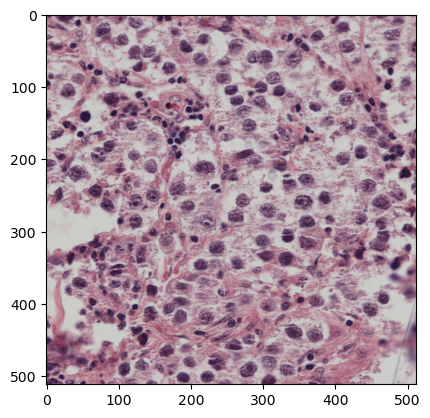

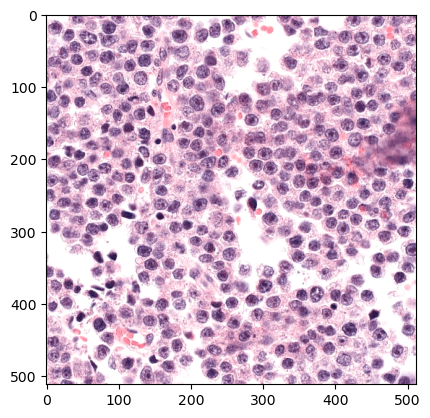

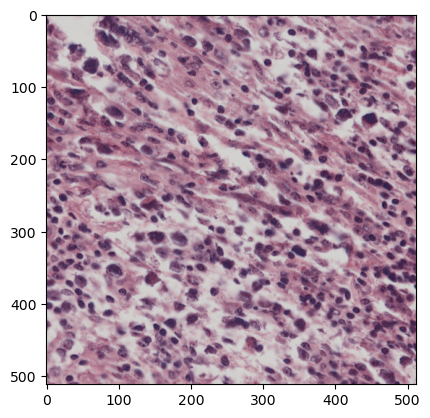

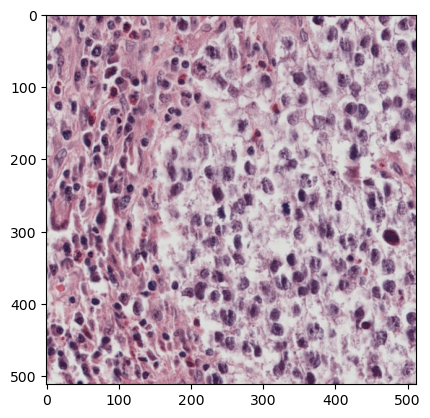

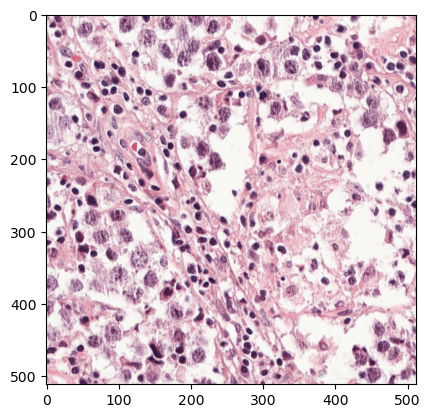

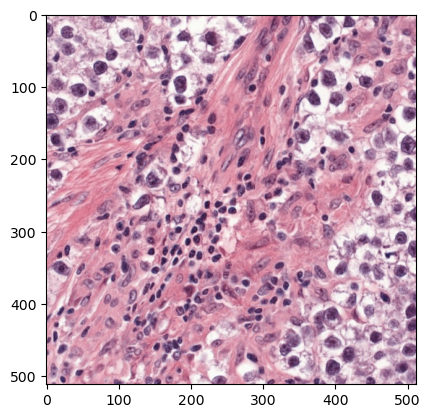

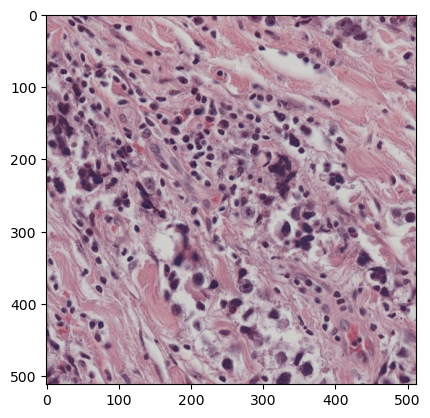

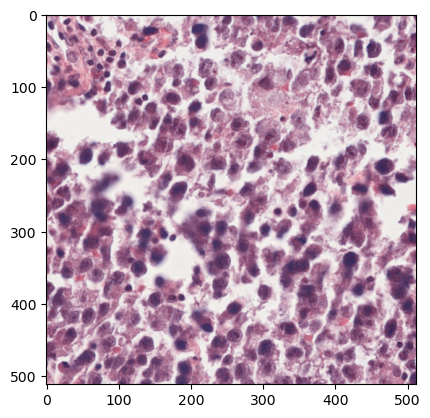

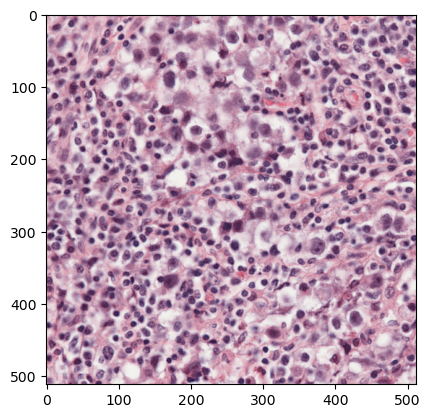

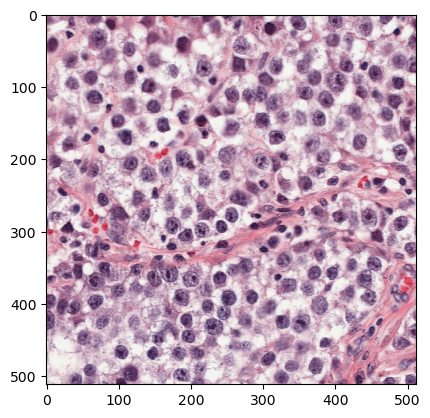

In [32]:
for i in range(10):
    plt.imshow(X[0][i])
    plt.show()

In [28]:
X[1]

array([[ 1. ,  1. ,  3.6],
       [ nan,  nan,  nan],
       [ 0. ,  0. ,  0.9],
       [ 0. ,  1. ,  1.7],
       [ 1. ,  0. ,  2.5],
       [ 0. ,  1. ,  2.1],
       [ 0. ,  0. ,  4.5],
       [ 0. ,  0. ,  4.5],
       [ 0. ,  0. ,  2.5],
       [ 0. ,  0. ,  0.7],
       [ 0. ,  0. ,  1.6],
       [ 0. ,  1. ,  1.5],
       [ 0. ,  1. ,  1.7],
       [ 0. ,  0. ,  1.9],
       [ 0. ,  1. ,  7.5],
       [ 0. ,  0. ,  1.4],
       [ 0. ,  1. ,  2.6],
       [ 0. ,  1. ,  1.5],
       [ 1. ,  1. ,  3.6],
       [ 0. ,  1. , 18.5],
       [ 0. ,  1. ,  6.2],
       [ 0. ,  0. ,  1.4],
       [ 0. ,  0. ,  1.9],
       [ 0. ,  1. ,  3.6],
       [ 0. ,  1. ,  3. ],
       [ 0. ,  1. ,  3.4],
       [ 0. ,  1. ,  2. ],
       [ 0. ,  0. ,  2.1],
       [ 1. ,  0. ,  2.5],
       [ 0. ,  1. , 18.5],
       [ 0. ,  1. , 18.5],
       [ 0. ,  1. ,  2. ]])